# Trigger Word detection
This tutorial inspired from the coursera deep learning specialization course. That I have completed a year ago. I have been writing this tutorial to help other to understand the NLP in depth.

Many more tutorial will come after this, stay tuned. I am making this repository a open source project for the NLP learning. However, in future I will be designing a open source project for Voice Assitance

In [200]:
import numpy as np
import random
import sys
import io
import os
import glob
import IPython
%matplotlib inline

In [21]:
import matplotlib.pyplot as plt
from scipy.io import wavfile
import os
from pydub import AudioSegment

# Calculate and plot spectrogram for a wav audio file
def graph_spectrogram(wav_file):
    rate, data = get_wav_info(wav_file)
    nfft = 200 # Length of each window segment
    fs = 8000 # Sampling frequencies
    noverlap = 120 # Overlap between windows
    nchannels = data.ndim
    if nchannels == 1:
        pxx, freqs, bins, im = plt.specgram(data, nfft, fs, noverlap = noverlap)
    elif nchannels == 2:
        pxx, freqs, bins, im = plt.specgram(data[:,0], nfft, fs, noverlap = noverlap)
    return pxx

# Load a wav file
def get_wav_info(wav_file):
    rate, data = wavfile.read(wav_file)
    return rate, data

# Used to standardize volume of audio clip
def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

# Load raw audio files for speech synthesis
def load_raw_audio():
    activates = []
    backgrounds = []
    negatives = []
    for filename in os.listdir("./data/positives"):
        if filename.endswith("wav"):
            activate = AudioSegment.from_wav("./data/positives/"+filename)
            activates.append(activate)
    for filename in os.listdir("./data/backgrounds"):
        if filename.endswith("wav"):
            background = AudioSegment.from_wav("./data/backgrounds/"+filename)
            backgrounds.append(background)
    for filename in os.listdir("./data/negatives"):
        if filename.endswith("wav"):
            negative = AudioSegment.from_wav("./data/negatives/"+filename)
            negatives.append(negative)
    return activates, negatives, backgrounds

# Dataset
1. We need to have some positive audio sample for trigger word like "alexa" or "ok google". You know what I mean.
2. Some negative sample audio like "alex", "mike", "danny", "ok googler", "google", "amex" etc
3. Some background noise audio sample "noise", "car noise", "baby voice" etc

In [25]:
IPython.display.Audio("./data/negatives/4.wav")

In [26]:
IPython.display.Audio("./data/backgrounds/1.wav")

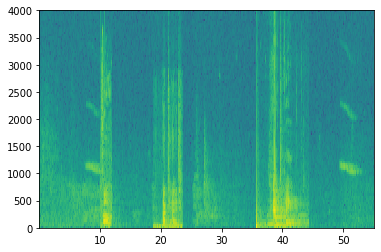

In [24]:
x = graph_spectrogram("audio_examples/example_train.wav")

In [18]:
_, data = wavfile.read("audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 5511)


## Generating a single training example¶

In [44]:
positives, negatives, backgrounds = load_raw_audio()

In [45]:
print("background len: " + str(len(backgrounds[0])))
print("positives[0] len: " + str(len(positives[0])))
print("positives[1] len: " + str(len(positives[1])))
print("negatives[0] len: " + str(len(negatives[0])))
print("negatives[1] len: " + str(len(negatives[1])))

background len: 10000
positives[0] len: 2204
positives[1] len: 1229
negatives[0] len: 1369
negatives[1] len: 1438


In [46]:
def get_random_time_segment(segment_ms):
    # Make sure segment doesn't run past the 10sec background 
    segment_start = np.random.randint(low=0, high=10000-segment_ms)   
    segment_end = segment_start + segment_ms - 1
    return (segment_start, segment_end)

In [47]:
def is_overlapping(segment_time, previous_segments):
    segment_start, segment_end = segment_time
    overlap = False
    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end and segment_end >= previous_start:
            overlap = True
    return overlap

In [48]:
overlap1 = is_overlapping((950, 1430), [(2000, 2550), (260, 949)])
overlap2 = is_overlapping((2305, 2950), [(824, 1532), (1900, 2305), (3424, 3656)])
print("Overlap 1 = ", overlap1)
print("Overlap 2 = ", overlap2)

Overlap 1 =  False
Overlap 2 =  True


In [49]:
def insert_audio_clip(background, audio_clip, previous_segments):
    segment_ms = len(audio_clip)
    segment_time = get_random_time_segment(segment_ms)
    while is_overlapping(segment_time, previous_segments):
        segment_time = get_random_time_segment(segment_ms)
    previous_segments.append(segment_time)
    new_background = background.overlay(audio_clip, position = segment_time[0])
    return new_background, segment_time

In [52]:
np.random.seed(5)
audio_clip, segment_time = insert_audio_clip(backgrounds[1], positives[0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

Segment Time:  (7286, 9489)


In [54]:
def insert_ones(y, segment_end_ms):
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    for i in range(segment_end_y+1, segment_end_y+51):
        if i < Ty:
            y[0, i] = 1.0
    return y

1. Our Training model needs 5511 input shape and frequency 101. So our input shape is (5511,101).
2. You can change it to any input shape as per your training.

Our Training data set as following shapes for input and output.

In [56]:
Tx = 5511
n_freq = 101
Ty = 1375

sanity checks: 0.0 1.0 0.0


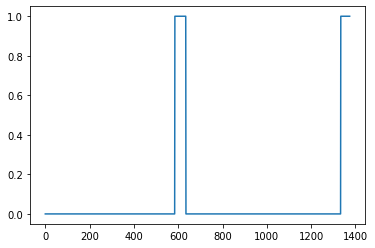

In [57]:
arr1 = insert_ones(np.zeros((1, Ty)), 9700)
plt.plot(insert_ones(arr1, 4251)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][634], arr1[0][635])

In [191]:
def create_training_example(background, positives, negatives, filename):
    np.random.seed(18)
    background = background - 20
    y = np.zeros((1, Ty))
    previous_segments = []
    number_of_positives = np.random.randint(0, 5)
    random_indices = np.random.randint(len(positives), size=number_of_positives)
    random_positives = [positives[i] for i in random_indices]
    for random_positive in random_positives:
        background, segment_time = insert_audio_clip(background, random_positive, previous_segments)
        segment_start, segment_end = segment_time
        y = insert_ones(y, segment_end)
        break
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]
    for random_negative in random_negatives:
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    background = match_target_amplitude(background, -20.0)
    file_handle = background.export(filename, format="wav")
    print("File ",filename," was saved in your directory.")
    x = graph_spectrogram(filename)
    return x, y

File  train1.wav  was saved in your directory.


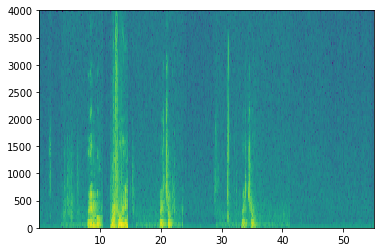

In [139]:
x1, y1 = create_training_example(backgrounds[0], positives, negatives, "train1.wav")

In [115]:
IPython.display.Audio("train1.wav")

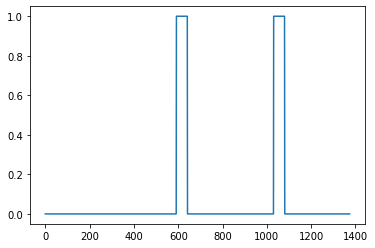

In [116]:
plt.plot(y1[0])

File  train2.wav  was saved in your directory.


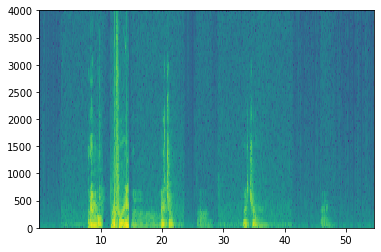

In [140]:
x2, y2 = create_training_example(backgrounds[1], positives, negatives, "train2.wav")

File  train3.wav  was saved in your directory.


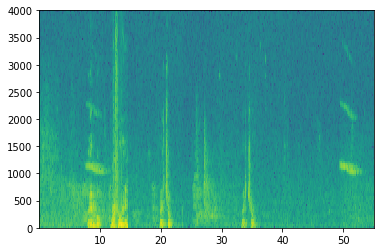

In [141]:
x3, y3 = create_training_example(backgrounds[2], positives, negatives, "train3.wav")

File  train4.wav  was saved in your directory.


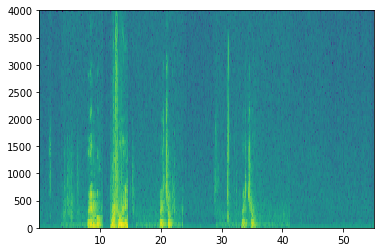

In [142]:
x4, y4 = create_training_example(backgrounds[0], positives, negatives, "train4.wav")

This following function will rotate the training data from (101,5511) to (5511,101)

In [143]:
def rotate90(x):
    x = np.rot90(x, k=1, axes=(0,1))
    return x

In [144]:
x1 = rotate90(x1)
x3 = rotate90(x3)
x4 = rotate90(x4)

In [145]:
y1 = rotate90(y1)
y3 = rotate90(y3)
y4 = rotate90(y4)

In [146]:
X = np.asarray([x1,x3,x4])
Y = np.asarray([y1,y3,y4])

### Model - Keras
1. This tutorial is based on keras model.
2. Following tutorial will cover designing the GRU and LSTM from scratch.

In [74]:
from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from keras.optimizers import Adam

Using TensorFlow backend.


In [75]:
def model(input_shape):
    X_input = Input(shape = input_shape)
    X = Conv1D(196, 15, strides=4)(X_input)                    
    X = BatchNormalization()(X)                                
    X = Activation('relu')(X)                                  
    X = Dropout(0.8)(X) 
    X = GRU(units = 128, return_sequences=True)(X)    
    X = Dropout(0.8)(X)                                        
    X = BatchNormalization()(X)
    X = GRU(units = 128, return_sequences=True)(X)
    X = Dropout(0.8)(X)
    X = BatchNormalization()(X)
    X = Dropout(0.8)(X)
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X)
    model = Model(inputs = X_input, outputs = X)
    return model

In [76]:
model = model(input_shape = (Tx, n_freq))

In [77]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 5511, 101)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization_1 (Batch (None, 1375, 196)         784       
_________________________________________________________________
activation_1 (Activation)    (None, 1375, 196)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 196)         0         
_________________________________________________________________
gru_1 (GRU)                  (None, 1375, 128)         124800    
_________________________________________________________________
dropout_2 (Dropout)          (None, 1375, 128)         0   

Because the NLP training takes a longer time, I have downloaded one pre trained model for this tutorial.

In [79]:
model = load_model('./tr_model.h5')

/Users/anilnayak/opt/anaconda3/lib/python3.7/site-packages/keras/engine/saving.py:384: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [85]:
model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 5511, 101)         0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1375, 256)         388096    
_________________________________________________________________
batch_normalization_7 (Batch (None, 1375, 256)         1024      
_________________________________________________________________
activation_3 (Activation)    (None, 1375, 256)         0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 1375, 256)         0         
_________________________________________________________________
gru_5 (GRU)                  (None, 1375, 128)         147840    
_________________________________________________________________
dropout_8 (Dropout)          (None, 1375, 128)         0   

In [94]:
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)

In [95]:
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [177]:
model.fit(X, Y, batch_size = 5, epochs=5)

Epoch 1/5
3/3 [==============================] - 3s 1s/step - loss: 0.7844 - accuracy: 0.8875
Epoch 2/5
3/3 [==============================] - 3s 998ms/step - loss: 0.8175 - accuracy: 0.8861
Epoch 3/5
3/3 [==============================] - 3s 1s/step - loss: 0.8271 - accuracy: 0.8812
Epoch 4/5
3/3 [==============================] - 3s 1s/step - loss: 0.7309 - accuracy: 0.8953
Epoch 5/5
3/3 [==============================] - 3s 1s/step - loss: 0.8177 - accuracy: 0.8858


File  dev_eval.wav  was saved in your directory.


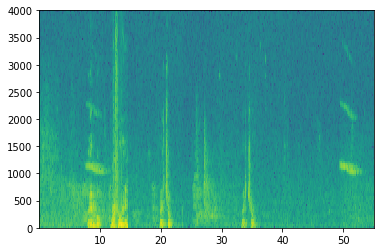

In [178]:
xd, yd = create_training_example(backgrounds[2], positives, negatives, "dev_eval.wav")

In [179]:
xd = rotate90(xd)
yd = rotate90(yd)

In [180]:
loss, acc = model.evaluate(np.asarray([xd]), np.asarray([yd]))
print("Dev set accuracy = ", acc)

1/1 [==============================] - 1s 895ms/step
Dev set accuracy =  0.9272727370262146


In [181]:
chime_file = "./audio_examples/chime.wav"
IPython.display.Audio(chime_file)

In [198]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    x = graph_spectrogram(filename)
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

In [199]:
def chime_on_positive(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    consecutive_timesteps = 0
    for i in range(Ty):
        consecutive_timesteps += 1
        if predictions[0,i,0] > threshold and consecutive_timesteps > 75:
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
            consecutive_timesteps = 0
    audio_clip.export("chime_output.wav", format='wav')

File  test_eval.wav  was saved in your directory.


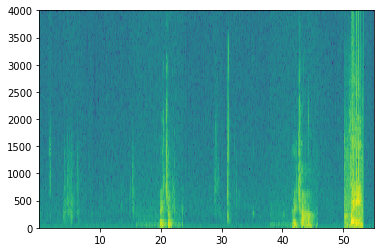

In [192]:
xe, ye = create_training_example(backgrounds[0], positives, negatives, "test_eval.wav")
xe = rotate90(xe)
ye = rotate90(ye)

In [193]:
IPython.display.Audio("test_eval.wav")

In [194]:
filename_test = "test_eval.wav"

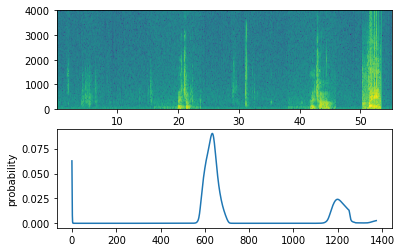

In [195]:
prediction = detect_triggerword(filename_test)

In [196]:
chime_on_positive(filename_test, prediction, 0.07)

In [197]:
IPython.display.Audio("./chime_output.wav")